<a href="https://colab.research.google.com/github/katiavas/prediction-DL/blob/main/predict_49_timestamps_LSTM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
notebook_dir = "/content/drive/MyDrive/Colab Notebooks/"

In [ ]:
from google.colab import drive
import requests
drive.mount('/content/drive')
import os
os.chdir(notebook_dir)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install torch==1.13.1+cu117 torchvision==0.14.1+cu117 torchaudio==0.13.1 --extra-index-url https://download.pytorch.org/whl/cu117
!pip install torch_geometric==2.0.1


# Optional dependencies:
# !pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-1.13.0+cu117.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/, https://download.pytorch.org/whl/cu117
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-1.13.0+cu117.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://data.pyg.org/whl/torch-1.13.0+cu117.html


In [ ]:
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import torch
from torch import nn
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(0)

In [ ]:
def load_array(filename, task):
    datapoint = np.load(filename)
    if task == 'task 1':
        initial_state = datapoint['initial_state']
        terminal_state = datapoint['terminal_state']
        return initial_state, terminal_state
    elif task == 'task 2' or task == 'task 3':
        whole_trajectory = datapoint['trajectory']
        # change shape: (num_bodies, attributes, time) ->  num_bodies, time, attributes
        whole_trajectory = np.swapaxes(whole_trajectory, 1, 2)
        initial_state = whole_trajectory[:, 0]
        target = whole_trajectory[:, 1:, 1:]  # drop the first timepoint (second dim) and mass (last dim) for the prediction task
        return initial_state, target
    else:
        raise NotImplementedError("'task' argument should be 'task 1', 'task 2' or 'task 3'!")

In [ ]:
# directory_path = 'data/task 1/train/'  # Path to the directory containing .npz files
"""
This cell gives an example of loading a datapoint with numpy for task 2 / 3.

The arrays returned by the function are structures as follows:
initial_state: shape (n_bodies, [mass, x, y, v_x, v_y])
remaining_trajectory: shape (n_bodies, time, [x, y, v_x, v_y])

Note that for this task, you are asked to evaluate performance only with regard to the predictions of the positions (x and y).
If you use the velocity of the remaining trajectory for training,
this use should be purely auxiliary for the goal of predicting the positions [x,y] over time.
While testing performance of your model on the test set, you do not have access to v_x and v_y of the remaining trajectory.

"""
directory_path = '/content/drive/MyDrive/data/task 2_3/train/'

initial_state_train = []  # List to store the data
remaining_trajectory_train = []  # List to store the data

for file_name in os.listdir(directory_path):
    if file_name.endswith('.npz'):
        file_path = os.path.join(directory_path, file_name)

        # Load the .npz file
        loaded_data = load_array(file_path, task='task 2')

        initial_state, remaining_trajectory = loaded_data


        # Append the data to the list

        initial_state_train.append(initial_state)
        remaining_trajectory_train.append(remaining_trajectory)


initial_state_train = np.array(initial_state_train)
remaining_trajectory_train = np.array(remaining_trajectory_train)
remaining_trajectory_train

<ipython-input-36-7949b1453c7f>:36: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  initial_state_train = np.array(initial_state_train)
<ipython-input-36-7949b1453c7f>:37: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  remaining_trajectory_train = np.array(remaining_trajectory_train)


array([array([[[-4.81263328,  0.38380924,  0.79098112,  0.23764702],
               [-4.7303875 ,  0.40487858,  0.85483036,  0.18230133],
               [-4.64147189,  0.41993579,  0.92454531,  0.11690458],
               ...,
               [-5.60762833, -3.38662032,  1.40251404, -0.53365888],
               [-5.46362473, -3.43604677,  1.4764422 , -0.45541831],
               [-5.31252748, -3.47779671,  1.54471081, -0.37994609]],

              [[-4.40464562, -6.97834531, -0.24704267,  0.28611467],
               [-4.42908339, -6.94822596, -0.24170854,  0.31633859],
               [-4.45298633, -6.91506343, -0.23634429,  0.34698736],
               ...,
               [-4.3011438 , -1.12791805,  0.64744801,  2.16043497],
               [-4.22912792, -0.91338151,  0.7971556 ,  2.12794843],
               [-4.14080063, -0.70295479,  0.97429521,  2.076499  ]],

              [[ 2.90333576, -6.95141163, -0.4543936 , -1.39098555],
               [ 2.85671068, -7.08076233, -0.47802464, -1.2

In [ ]:
directory_path = '/content/drive/MyDrive/data/task 2_3/test/'

initial_state_test = []  # List to store the data
remaining_trajectory_test = []  # List to store the data

for file_name in os.listdir(directory_path):
    if file_name.endswith('.npz'):
        file_path = os.path.join(directory_path, file_name)

        # Load the .npz file
        loaded_data = load_array(file_path, task='task 2')

        initial_state, remaining_trajectory = loaded_data

        # Drop the v_x and v_y columns from remaining_trajectory
        remaining_trajectory = remaining_trajectory[:, :, :2]  # Select columns [x, y]

        # Append the data to the list
        initial_state_test.append(initial_state)
        remaining_trajectory_test.append(remaining_trajectory)

initial_state_test = np.array(initial_state_test)
remaining_trajectory_test = np.array(remaining_trajectory_test)



<ipython-input-37-8b6a964c0158>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  initial_state_test = np.array(initial_state_test)
<ipython-input-37-8b6a964c0158>:23: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  remaining_trajectory_test = np.array(remaining_trajectory_test)


In [ ]:
remaining_trajectory_train[0][0]

array([[-4.81263328,  0.38380924,  0.79098112,  0.23764702],
       [-4.7303875 ,  0.40487858,  0.85483036,  0.18230133],
       [-4.64147189,  0.41993579,  0.92454531,  0.11690458],
       [-4.54524659,  0.42780274,  1.00122067,  0.03773912],
       [-4.44095487,  0.42683599,  1.08607999, -0.06097131],
       [-4.327721  ,  0.4146493 ,  1.18019512, -0.18867619],
       [-4.20460781,  0.38760091,  1.28341114, -0.36181903],
       [-4.07089655,  0.33977845,  1.39033478, -0.61112585],
       [-3.92722965,  0.26086013,  1.47422718, -0.9978946 ],
       [-3.7804386 ,  0.13176343,  1.41601031, -1.63882964],
       [-3.66343887, -0.0774949 ,  0.75756268, -2.55903088],
       [-3.66230779, -0.35551638, -0.76843611, -2.75734307],
       [-3.79095825, -0.59607683, -1.63581296, -2.02396734],
       [-3.96748658, -0.76633716, -1.83638335, -1.42702493],
       [-4.15196177, -0.88927399, -1.83773899, -1.06222358],
       [-4.33338211, -0.98350525, -1.78662441, -0.84057245],
       [-4.50885678, -1.

In [ ]:
!pip install ipdb
import ipdb

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 20.0 MB/s eta 0:00:00


In [ ]:
from torch_geometric.data import Data

def create_adjacency_matrix(num_vertices):
    adjacency_matrix = np.array([[1] * num_vertices for _ in range(num_vertices)])

    for i in range(num_vertices):
        adjacency_matrix[i][i] = 0

    return adjacency_matrix

def get_data_object(x, y):
  data_list = []
  for i in range(len(x)):
    x_tensor = torch.tensor(x[i])
    y_tensor = torch.tensor(y[i])
    num_nodes = x_tensor.shape[0]

    # Create the node feature matrix
    x_tensor = x_tensor.view(num_nodes, -1)

    # Create the target labels
    y_tensor = y_tensor.view(num_nodes, 49, y_tensor.shape[2])
    # Create the edge connectivity (assuming a fully connected graph)
    adjacency_matrix = create_adjacency_matrix(num_nodes)
    edge_index = np.argwhere(np.array(adjacency_matrix) == 1).T.tolist()
    #edge_index = np.nonzero(adjacency_matrix).T()
    edge_index_tensor = torch.tensor(edge_index, dtype=torch.long)

    # Create the Data object
    data = Data(x=x_tensor, edge_index=edge_index_tensor, y=y_tensor)
    data_list.append(data)
  return data_list
data_list = get_data_object(initial_state_train, remaining_trajectory_train)
data_list[1]

Data(x=[9, 5], edge_index=[2, 72], y=[9, 49, 4])

In [ ]:
data_list[1].x.shape

torch.Size([9, 5])

In [ ]:
from sklearn.model_selection import train_test_split
from torch_geometric.loader import DataLoader

'''
train_data, val_data = train_test_split(processed_data, test_size=0.2, random_state=42)
train_loader = DataLoader(train_data, batch_size=64, shuffle=True)
val_loader = DataLoader(val_data, batch_size=64)'''
train_loader = DataLoader(data_list, batch_size=30)
train_loader

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from torch_geometric.loader import DataLoader
from sklearn.metrics import mean_squared_error


train_data, val_data = train_test_split(data_list, test_size=0.2, random_state=42)
train_loader = DataLoader(train_data, batch_size=30, shuffle=True)
val_loader = DataLoader(val_data, batch_size=30)
test_data = get_data_object(initial_state_test, remaining_trajectory_test)
test_loader = DataLoader(test_data, batch_size=30)

def LinearBaseline(x):
    p = []
    time = 0
    for i in range(49):
        positions_x = x[:, 1] + x[:, 3] * time
        positions_y = x[:, 2] + x[:, 4] * time

        time += 0.1
        p.append(np.stack((positions_x, positions_y), axis=1))

    stacked_positions = np.stack(p, axis=1)
    return stacked_positions

# Define your linear baseline model
def ConstantBaseline(x):
      p = []
      time = 0
      for i in range(49):

        positions_x = x[:, 1]
        positions_y = x[:, 2]
        p.append(np.stack((positions_x, positions_y), axis=1))
      stacked_positions = np.stack(p, axis=1)

      return stacked_positions
def evaluate_baseline(data_loader,model):
    total_loss = 0

    for data in data_loader:
        x = data.x  # Input features
        y = data.y[:, :, 0:2]  # Target labels (positions)

        out = model(x)
        out = out.reshape(out.shape[0], -1)  # Reshape to 2D array
        y = y.reshape(y.shape[0], -1)  # Reshape to 2D array

        loss = mean_squared_error(out, y)
        total_loss += loss

    avg_loss = total_loss / len(data_loader)
    print(avg_loss)

linear_train_data = evaluate_baseline(train_loader, LinearBaseline)
linear_val_data = evaluate_baseline(val_loader, LinearBaseline)
linear_test_data = evaluate_baseline(test_loader, LinearBaseline)

print('constant')
Constant_train_data = evaluate_baseline(train_loader, ConstantBaseline)
Constant_val_data = evaluate_baseline(val_loader, ConstantBaseline)
Constant_test_data = evaluate_baseline(test_loader, ConstantBaseline)




6.164602055777174
6.654215143965846
7.424605568700631
constant
5.156104325315545
4.777658468841949
5.191076727027495


ValueError: ignored

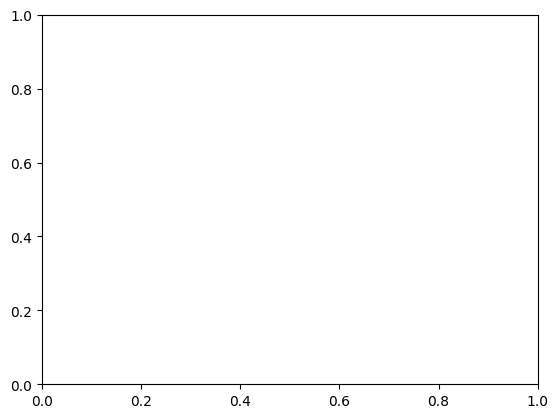

In [ ]:
import matplotlib.pyplot as plt

# Define the model names and corresponding losses
model_names = ['NN Model', 'Linear Baseline', 'Constant Baseline']
train_losses = [6.4080891296554485, 5.1371170039560505]
val_losses = [5.3033, 21.168016585892353, 13.281135515064955]
test_losses = [4.7995, 22.457220100054865, 11.544181071746573]

# Set the bar width
bar_width = 0.25

# Set the positions of the bars on the x-axis
r1 = range(len(model_names))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]

# Create the bar chart
plt.bar(r1, train_losses, color='b', width=bar_width, edgecolor='black', label='Train Loss')
plt.bar(r2, val_losses, color='g', width=bar_width, edgecolor='black', label='Validation Loss')
plt.bar(r3, test_losses, color='r', width=bar_width, edgecolor='black', label='Test Loss')

# Add x-axis labels and tick labels
plt.xlabel('Models')
plt.ylabel('Loss')
plt.xticks([r + bar_width for r in range(len(model_names))], model_names)

# Add a legend
plt.legend()

# Display the bar chart
plt.show()


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import MessagePassing
from torch_geometric.utils import add_self_loops, degree
from torch_geometric.nn import SAGEConv

device = 'cpu'
train_loader = DataLoader(data_list, batch_size=30)
train_loader

class GNNPredictor(MessagePassing):
    def __init__(self, in_channels, hidden_channels):
        self.hidden_dim = hidden_channels
        super(GNNPredictor, self).__init__(aggr='mean')  # Use "mean" aggregation for message passing
        self.lin1 = nn.Linear(in_channels, hidden_channels, dtype=torch.float32)
        self.lin2 = nn.Linear(hidden_channels, hidden_channels)
        #self.lin2 = nn.Linear(hidden_channels, hidden_channels)

        self.lin3 = nn.Linear(hidden_channels*2, 2)  # Output 2-dimensional terminal positions
        self.lstm = nn.LSTM(hidden_channels, hidden_channels*2, 1)


    def forward(self, x, edge_index):
      x = self.lin1(x)  # Explicitly cast x to float
      x = F.relu(x)
      x = self.lin2(x)
      x = self.propagate(edge_index, size=(x.size(0), x.size(0)), x=x)
      # print(x.shape)
      #x = self.lin3(x)
      #ipdb.set_trace(context=10)
      x_time = x.unsqueeze(1).repeat(1, 49, 1)
      x_lstm = self.lstm(x_time)
      pred = self.lin3(x_lstm[0])
      #outputs.append(pred[:, 0:2])

      #ipdb.set_trace(context=10)
      #output_tensor = torch.tensor(outputs, dtype=torch.float32)
      #output_tensor = np.swapaxes(output_tensor, 0, 1)

      return pred


    def message(self, x_j, edge_index, size):
        row, col = edge_index
        deg = degree(col, size[0], dtype=x_j.dtype)
        deg_inv_sqrt = deg.pow(-0.5)
        norm = deg_inv_sqrt[row] * deg_inv_sqrt[col]
        return x_j * norm.view(-1, 1)


# Create an instance of the GNNPredictor model
num_features = 5
seq_len = 49
model = GNNPredictor(in_channels=num_features, hidden_channels=64)
model.to(device)


# Define the loss function
loss_fn = nn.MSELoss()



# Define the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
num_epochs=100
# Training loop
model.train()  # Set the model in training mode
for epoch in range(num_epochs):
    total_loss = 0
    for batch in train_loader:
        #batch = [tensor.to(device) for tensor in batch]

        optimizer.zero_grad()  # Clear gradients

        # Forward pass
        x = batch.x
        # ipdb.set_trace(context=10)
        x = x.to(torch.float32).to(device)
        # x = x.float()
        # print(x)
        edge_index = batch.edge_index
        edge_index = edge_index.to(torch.long).to(device)

        #ipdb.set_trace(context=10)

        # print(edge_index)
        y_true = batch.y
        y_true = y_true.to(torch.float32).to(device)
        y_pred = model(x, edge_index)

        #ipdb.set_trace(context=10)
        # Compute loss
        loss = loss_fn(y_pred, y_true)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        total_loss += loss.item()



    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}")


Epoch 1/100, Loss: 19.2891
Epoch 2/100, Loss: 16.1074
Epoch 3/100, Loss: 13.7902
Epoch 4/100, Loss: 12.4386
Epoch 5/100, Loss: 11.8721
Epoch 6/100, Loss: 11.0159
Epoch 7/100, Loss: 10.7238
Epoch 8/100, Loss: 9.9722
Epoch 9/100, Loss: 9.7811
Epoch 10/100, Loss: 9.6213
Epoch 11/100, Loss: 9.6837
Epoch 12/100, Loss: 8.9030
Epoch 13/100, Loss: 8.4648
Epoch 14/100, Loss: 8.4562
Epoch 15/100, Loss: 8.5475
Epoch 16/100, Loss: 8.3274
Epoch 17/100, Loss: 8.2168
Epoch 18/100, Loss: 8.0655
Epoch 19/100, Loss: 7.5016
Epoch 20/100, Loss: 7.1652
Epoch 21/100, Loss: 7.2440
Epoch 22/100, Loss: 7.4477
Epoch 23/100, Loss: 7.9137
Epoch 24/100, Loss: 7.8571
Epoch 25/100, Loss: 7.6483
Epoch 26/100, Loss: 7.4342
Epoch 27/100, Loss: 8.0348
Epoch 28/100, Loss: 8.3444
Epoch 29/100, Loss: 8.2510
Epoch 30/100, Loss: 7.7203
Epoch 31/100, Loss: 7.7143
Epoch 32/100, Loss: 7.8675
Epoch 33/100, Loss: 7.4946
Epoch 34/100, Loss: 7.1016
Epoch 35/100, Loss: 6.7219
Epoch 36/100, Loss: 6.2494
Epoch 37/100, Loss: 5.9858
Epo

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import MessagePassing
from torch_geometric.utils import add_self_loops, degree
from torch_geometric.nn import SAGEConv

device = 'cuda:0'
train_data, val_data = train_test_split(data_list, test_size=0.2, random_state=42)
train_loader = DataLoader(train_data, batch_size=30, shuffle=True)
val_loader = DataLoader(val_data, batch_size=30)
test_data = get_data_object(initial_state_test, remaining_trajectory_test)
test_loader = DataLoader(test_data, batch_size=30)


class GNNPredictor(MessagePassing):
    def __init__(self, in_channels, hidden_channels):
        self.hidden_dim = hidden_channels
        super(GNNPredictor, self).__init__(aggr='mean')  # Use "mean" aggregation for message passing
        self.lin1 = nn.Linear(in_channels, hidden_channels, dtype=torch.float32)
        self.lin2 = nn.Linear(hidden_channels, hidden_channels)
        #self.lin2 = nn.Linear(hidden_channels, hidden_channels)

        self.lin3 = nn.Linear(hidden_channels*2, 4)  # Output 2-dimensional terminal positions
        self.lstm = nn.LSTM(hidden_channels, hidden_channels*2, 1)


    def forward(self, x, edge_index):
      x = self.lin1(x)  # Explicitly cast x to float
      x = F.relu(x)
      x = self.lin2(x)
      x = self.propagate(edge_index, size=(x.size(0), x.size(0)), x=x)
      # print(x.shape)
      #x = self.lin3(x)
      #ipdb.set_trace(context=10)
      x_time = x.unsqueeze(1).repeat(1, 49, 1)
      x_lstm = self.lstm(x_time)
      pred = self.lin3(x_lstm[0])
      #outputs.append(pred[:, 0:2])

      #ipdb.set_trace(context=10)
      #output_tensor = torch.tensor(outputs, dtype=torch.float32)
      #output_tensor = np.swapaxes(output_tensor, 0, 1)

      return pred


    def message(self, x_j, edge_index, size):
        row, col = edge_index
        deg = degree(col, size[0], dtype=x_j.dtype)
        deg_inv_sqrt = deg.pow(-0.5)
        norm = deg_inv_sqrt[row] * deg_inv_sqrt[col]
        return x_j * norm.view(-1, 1)


# Create an instance of the GNNPredictor model
num_features = 5
seq_len = 49
model = GNNPredictor(in_channels=num_features, hidden_channels=64)
model.to(device)


# Define the loss function
loss_fn = nn.MSELoss()



# Define the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
num_epochs=100
# Training loop
for epoch in range(num_epochs):
    total_loss = 0
    model.train()  # Set the model in training mode
    for batch in train_loader:
        #batch = [tensor.to(device) for tensor in batch]

        optimizer.zero_grad()  # Clear gradients

        # Forward pass
        x = batch.x
        # ipdb.set_trace(context=10)
        x = x.to(torch.float32).to(device)
        # x = x.float()
        # print(x)
        edge_index = batch.edge_index
        edge_index = edge_index.to(torch.long).to(device)

        # print(edge_index)
        y_true = batch.y
        print(y_true.shape)
        y_true = y_true.to(torch.float32).to(device)
        y_pred = model(x, edge_index)

        # Compute loss
        loss = loss_fn(y_pred, y_true)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
    avg_loss = total_loss / len(train_loader)
    # total_epoch_loss += avg_loss / num_epochs
    print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {avg_loss:.4f}")

    # Validation phase
    model.eval()  # Set the model in evaluation mode
    with torch.no_grad():
        total_val_loss = 0
        for batch in val_loader:
            batch = batch  # Move the batch to the device (e.g., GPU)

            x = x.to(torch.float32).to(device)
            edge_index = edge_index.to(torch.long).to(device)
            y_true = y_true.to(torch.float32).to(device)
            y_pred = model(x, edge_index)

            val_loss = loss_fn(y_pred, y_true)
            total_val_loss += val_loss.item()



        avg_val_loss = total_val_loss / len(val_loader)
        print(f"Epoch {epoch+1}/{num_epochs}, Validation Loss: {avg_val_loss:.4f}")


In [ ]:
test_data = get_data_object(initial_state_test, remaining_trajectory_test)

test_loader = DataLoader(test_data, batch_size=30)
test_loader

In [ ]:
model.eval()  # Set the model in evaluation mode
total_loss = 0

with torch.no_grad():
    for batch in test_loader:
        x = batch.x
        print(x.shape)
        x = x.to(torch.float32).to(device)

        edge_index = batch.edge_index
        edge_index = edge_index.to(torch.long).to(device)

        y_true = batch.y
        y_true = y_true.to(torch.float32).to(device)

        y_pred = model(x, edge_index)

        loss = loss_fn(y_pred[:,:,:2], y_true)
        total_loss += loss.item()

avg_loss = total_loss / len(test_loader)
print(avg_loss)